In [3]:
import tensorflow as tf

import os
import pathlib

from matplotlib import pyplot as plt
from IPython import display

### Downloading Dataset

In [4]:
dataset_name = "facades"

In [5]:
_URL = f'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{dataset_name}.tar.gz'

path_to_zip = tf.keras.utils.get_file(
    fname=f"{dataset_name}.tar.gz",
    origin=_URL,
    extract=True)

path_to_zip  = pathlib.Path(path_to_zip)

PATH = path_to_zip.parent/dataset_name

30168306/30168306 [==============================] - 29s 1us/step


In [6]:
list(PATH.parent.iterdir())

[PosixPath('/root/.keras/datasets/facades.tar.gz'),
 PosixPath('/root/.keras/datasets/facades')]

#### Visualizing images from dataset

In [7]:
sample_image = tf.io.read_file(str(PATH / 'train/5.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

(256, 512, 3)


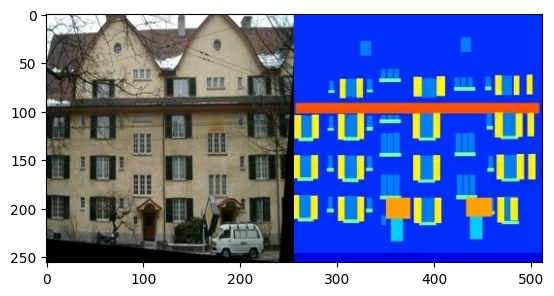

In [8]:
plt.figure()
plt.imshow(sample_image)

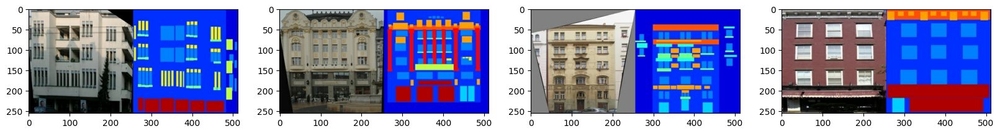

In [9]:
fig, ax = plt.subplots(ncols = 4,  figsize= (20,20))

for i in range(4):
  img_pth = 'train/'+ str(i+1) +'.jpg'
  sample_image = tf.io.read_file(str(PATH / img_pth))
  sample_image = tf.io.decode_jpeg(sample_image)
  ax[i].imshow(sample_image)

### Separating real and input images

In [10]:
def load(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image
  w = tf.shape(image)[1]
  w = w // 2
  input_image = image[:, w:, :]
  real_image = image[:, :w, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

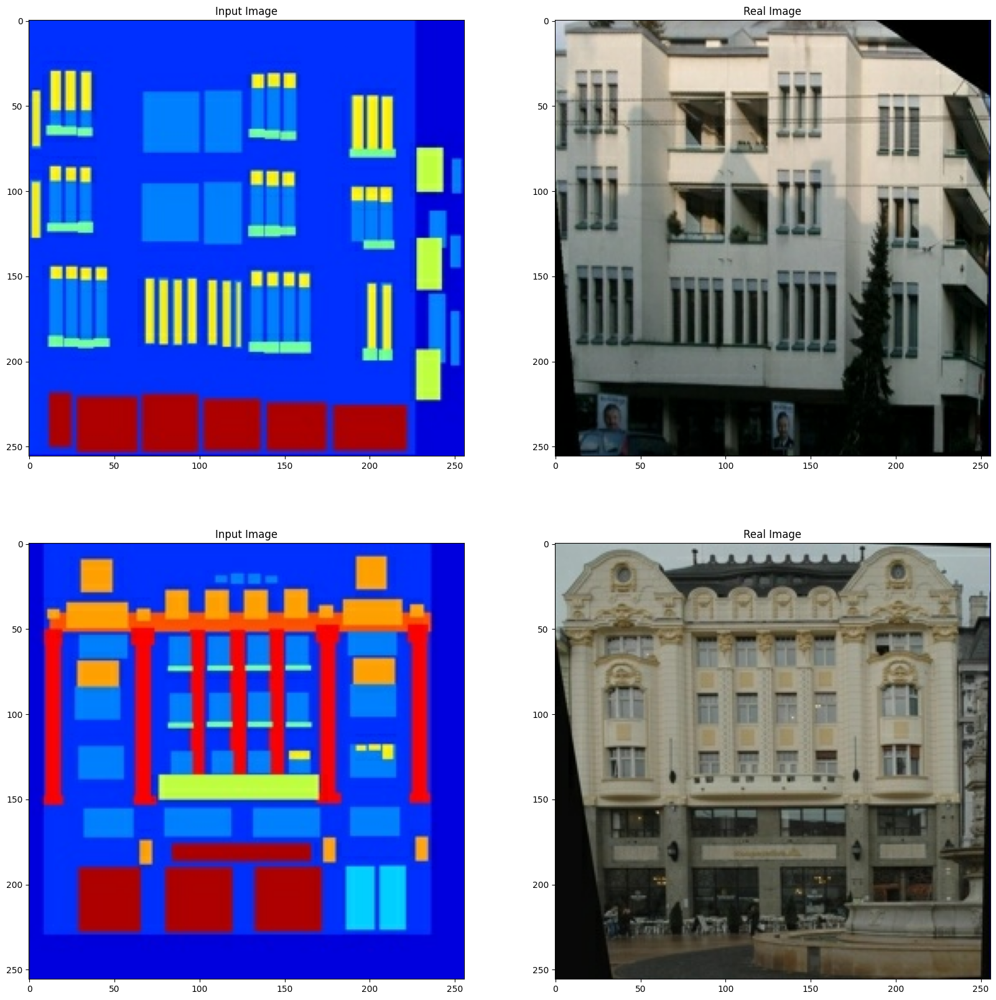

In [11]:
##plotting seperated images
fig, ax = plt.subplots(nrows = 2, ncols = 2,  figsize= (20,20))

for i in range(2):
  img_pth = 'train/'+ str(i+1) +'.jpg'
  input_image, real_image = load(str(PATH / img_pth))
  imgs = [input_image, real_image]
  for idx, img in enumerate(imgs):
    ax[i][idx].imshow(img/255.0)
    if idx%2 != 0:
      ax[i][idx].title.set_text('Real Image')
    else:
      ax[i][idx].title.set_text('Input Image')

#### Preprocessing data according to paper
As described in the pix2pix paper, we need to apply random jittering and mirroring to preprocess the training set.

Define several functions that:

Resize each 256 x 256 image to a larger height and width—286 x 286.
Randomly crop it back to 256 x 256.
Randomly flip the image horizontally i.e. left to right (random mirroring).
Normalize the images to the [-1, 1] range.

In [12]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [13]:
#resize function to resize images to 286*286 using nearest neighbor interpolation
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [14]:
#function to perfrom random cropping
def random_crop(input_image, real_image):
  #row wise stacking input on top and real on the bottom
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [15]:
# function for Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [16]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing images to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping images back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

#### Plotting processed outputs

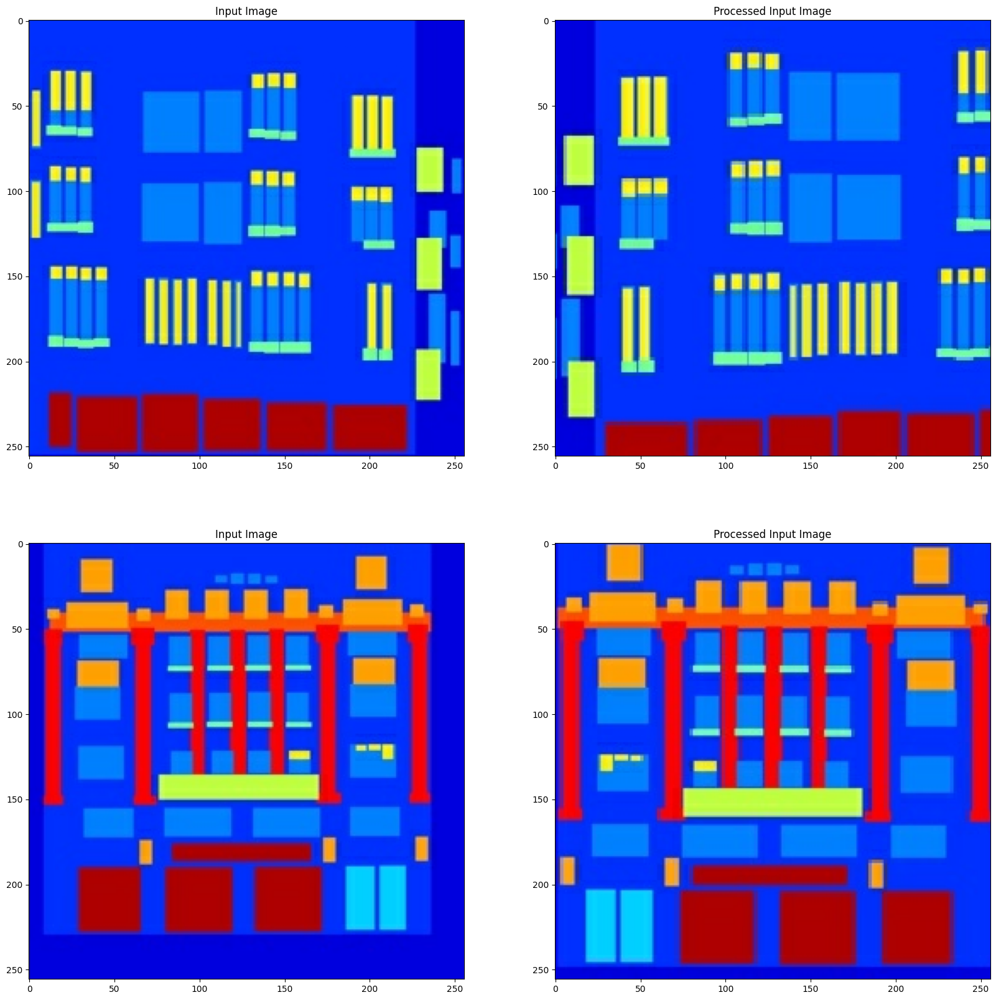

In [17]:
fig, ax = plt.subplots(nrows = 2, ncols = 2,  figsize= (20,20))

for i in range(2):
  img_pth = 'train/'+ str(i+1) +'.jpg'
  input_image, real_image = load(str(PATH / img_pth))
  processed_input_image,_ = random_jitter(input_image, real_image)
  imgs = [input_image, processed_input_image]
  for idx, img in enumerate(imgs):
    ax[i][idx].imshow(img/255.0)
    if idx%2 != 0:
      ax[i][idx].title.set_text('Processed Input Image')
    else:
      ax[i][idx].title.set_text('Input Image')

#### Defining dataset loading functions

In [18]:
def load_image_train(image_file): #load fn - 1. load images from image path, 2. apply jitter function, 3. normalize between -1 and 1
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [19]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

##building input data pipeline with tf.data

In [20]:
#training set
train_dataset = tf.data.Dataset.list_files(str(PATH / 'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)  #mapping load function - load, jitter normalize
train_dataset = train_dataset.shuffle(BUFFER_SIZE)   #shuffling dataset
train_dataset = train_dataset.batch(BATCH_SIZE)   #training batch

In [21]:
sample_batch = next(iter(train_dataset))

In [22]:
sample_batch[0].shape   #input image

TensorShape([1, 256, 256, 3])

In [23]:
len(sample_batch) #input and real image

2

Text(0.5, 1.0, 'Input Image in a batch')

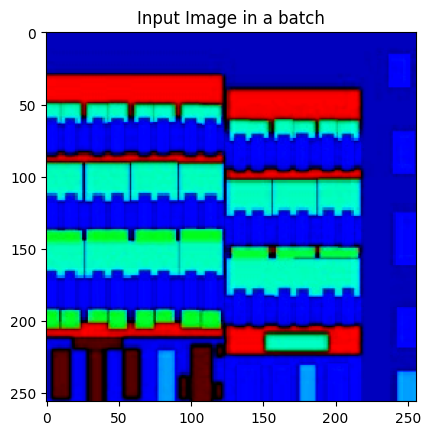

In [24]:
plt.imshow(sample_batch[0][0])
plt.title('Input Image in a batch') #x

Text(0.5, 1.0, 'Corresponding real image in a batch')

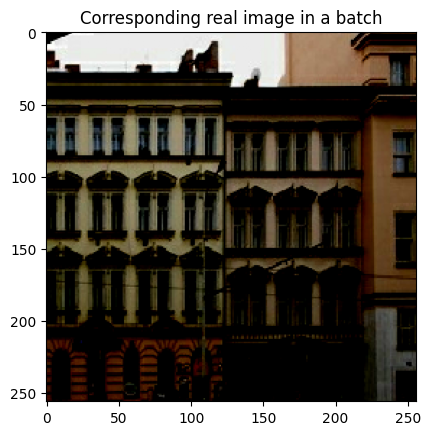

In [25]:
plt.imshow(sample_batch[1][0]) #y
plt.title('Corresponding real image in a batch')

In [26]:
#test set
try:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

### Building the Generator Architecture:
U-Net Architecture:
* Upsampling Block
* Dowsampling or convolutional block
* skip connections

#### Downsampling block

In [27]:
#downsampling block
def downsample(filters, size, apply_batchnorm=True):
  #weights initializer
  initializer = tf.random_normal_initializer(0., 0.02)

  #keras sequential model for model architecture
  result = tf.keras.Sequential()
  #stride = 2 so no need of pooling for downsampling
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))
  #batchnorm layer
  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [28]:
sample_batch = next(iter(train_dataset))

In [29]:
sample_batch[0][0].shape

TensorShape([256, 256, 3])

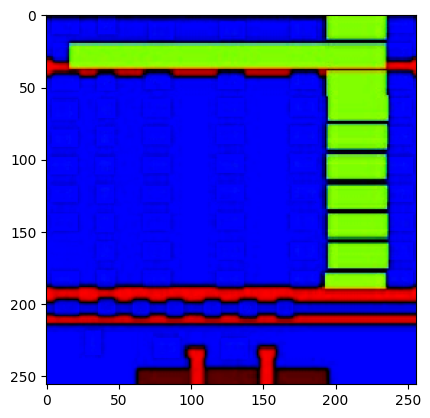

In [30]:
plt.imshow(sample_batch[0][0])

In [31]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(sample_batch[0][0], 0))
print (down_result.shape)

(1, 128, 128, 3)


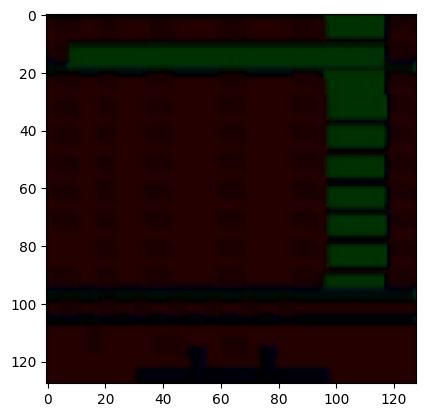

In [32]:
plt.imshow(down_result[0])

#### Upsampling Block

In [33]:
#upsampling block
def upsample(filters, size, apply_dropout=False):
  #weight initialization
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  #transposed conv for upsampling
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  #for first 3 blocks
  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [34]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


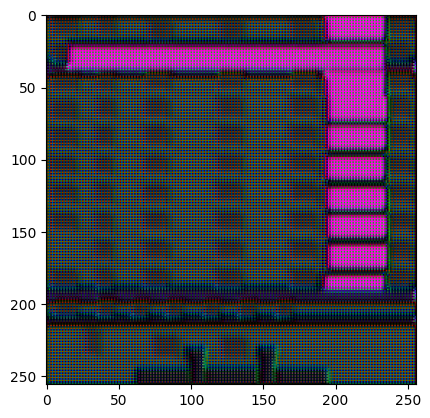

In [35]:
plt.imshow((up_result[0]*127.5))

#### Generator Model

In [36]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]
  #weight initializer
  initializer = tf.random_normal_initializer(0., 0.02)
  #output_layer
  last = tf.keras.layers.Conv2DTranspose(filters=3, kernel_size= 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)  #appending outputs from downsampling for skip connections

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])  #concatenating outputs from downsampling layers

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

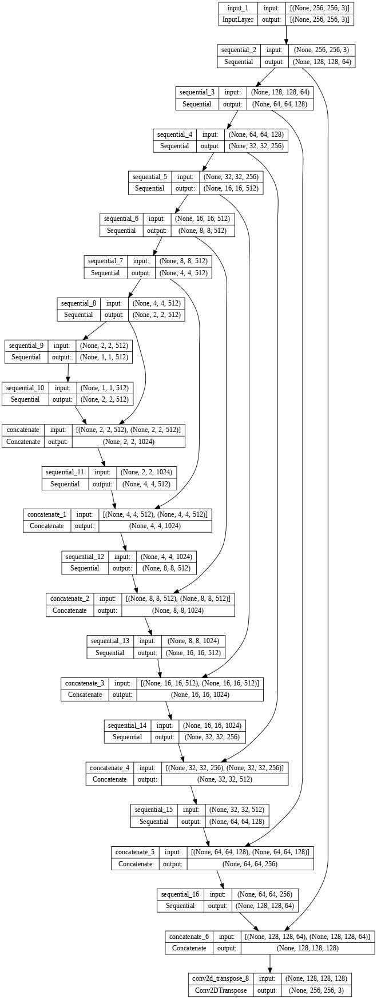

In [37]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

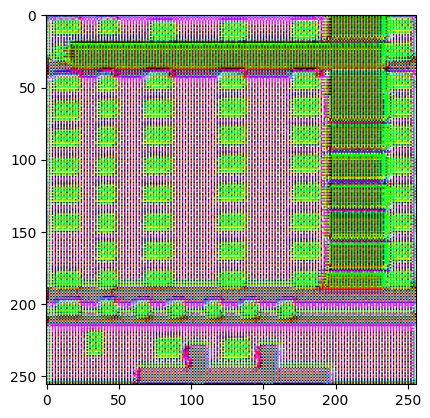

In [38]:
#testing generator
import numpy as np
gen_output = generator(tf.expand_dims(sample_batch[0][0], 0), training=False)
plt.imshow((np.squeeze(gen_output))*127.5)

### Building the Discriminator Arcihtecture

* input: real image and generated image (channel concatenation).
* output: (30 * 30 * 1) image that classifies the 70*70 patch of the input image.


In [39]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64) #conv-> batch_normalization->LeakyRelu
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

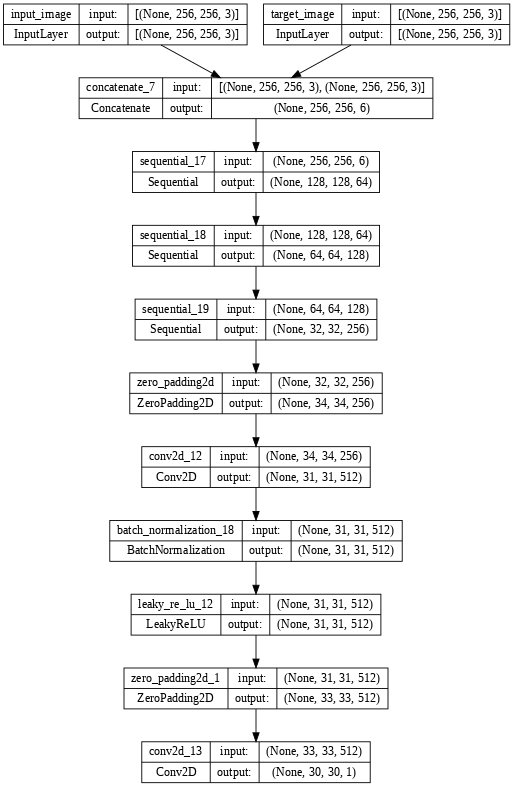

In [40]:
##visualizing discriminator

discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

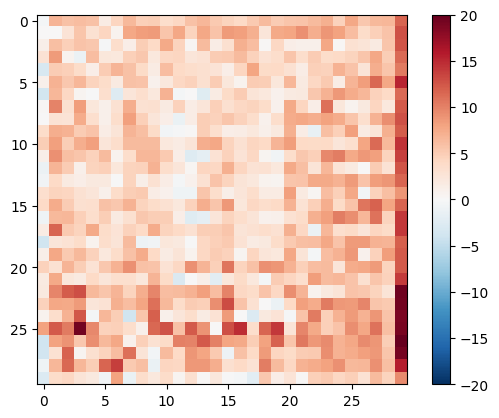

In [41]:
#testing the discriminator
disc_out = discriminator([sample_batch[1], gen_output], training=False)
plt.imshow((disc_out[0]*255.0), vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

### Defining Loss functions and Optimizers

#### Defining Generator Loss

In [42]:
LAMBDA = 100  # generator loss =  BCE(1's like, Discriminator output) + LAMBDA* MAE(real_image, generated_image)
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [43]:
def generator_loss(disc_generated_output, gen_output, target):
  #BCE(1's like, Discriminator output)
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  # MAE(real_image, generated_image)
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
  # generator loss =  BCE(1's like, Discriminator output) + LAMBDA* MAE(real_image, generated_image)
  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

#### Defining Discriminator Loss

In [44]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output) #sigmoid between all 1's and discriminator output on (x - input, y - target)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output) #sigmoid between all 0's and discriminator output on (x - input, z - generated image)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

#### Defining optimizers

In [45]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)   # learning rate = 0.0002
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# The beta_1 hyperparameter is the exponential decay rate for the first moment estimates (mean) of the gradients.
# It controls how much of the past gradients' information is retained. In this case, it is set to 0.5, \
# meaning that the optimizer will consider the current gradient and 50% of the accumulated gradient from previous steps.

### Defining Generate Images Function

In [62]:
from tensorflow.keras.preprocessing.image import array_to_img
import os

def generate_images(model, test_input, tar, save = False, step = None):
  prediction = model(test_input, training=True)
  if save:
    img = tf.concat([test_input[0], tar[0], prediction[0]], axis = 1)
    img = array_to_img(img)
    img.save(os.path.join('generated images', f'generated_img_step_{step}.png'))
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

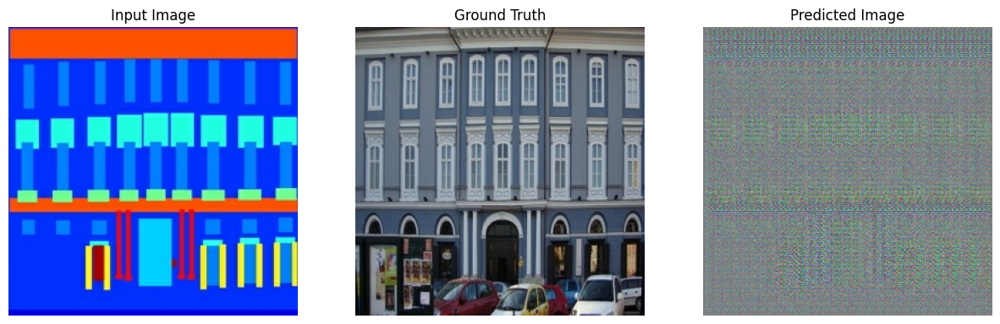

In [47]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

###Defining logs and training function



In [50]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

### Training function

In [51]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

#### Defining fit function

In [63]:
import time
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 5 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 5 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target, save = True, step = step)
      print(f"Step: {step//5}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


In [65]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

Time taken for 5 steps: 18.41 sec



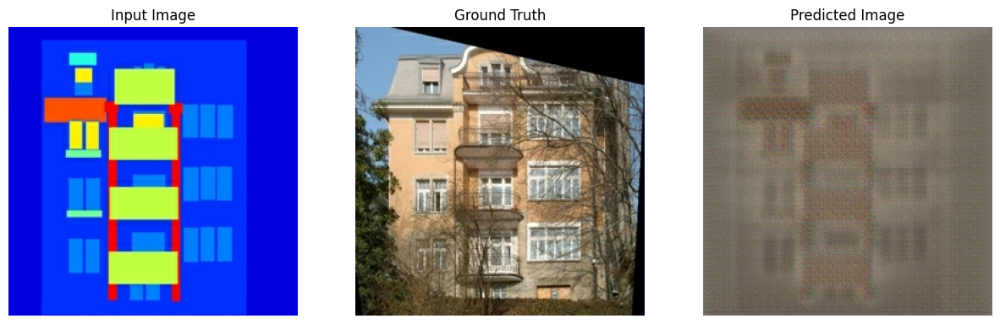

Step: 1k
.

In [66]:
fit(train_dataset, test_dataset, steps=10)